In [1]:
import matplotlib.pyplot as plt

PRÁCTICA MACHINE LEARNING: Predecir el mercado de valores

 ¡Hola y bienvenido a la Práctica de Machine Learning más difícil del mundo!

Este notebook está diseñado para ayudarte a comenzar con la práctica.

En este cuaderno vamos a:

- Descargar y explorar el conjunto de datos
- Entrenar y evaluar este primer modelo de aprendizaje automático
- Implementar el modelo para comenzar a realizar predicciones

In [5]:
# Instala dependencias
# !pip install -q numerapi pandas pyarrow matplotlib lightgbm scikit-learn cloudpickle scipy==1.10.1

# Gráficas Inline
# %matplotlib inline

## 1.- DATASET

A alto nivel, trabajaremos con un conjunto de datos tabulares que describe el mercado de valores a lo largo del tiempo.

Cada fila representa una acción en un momento específico, donde "id" es la identificación de la acción y "era" es la fecha. 

Las características describen los atributos de la acción (por ejemplo, el ratio Price/Earning) conocidos en una fecha dada, y "target" es una medida de rendimientos a 20 días.

El conjunto de datos está ofuscado, lo que significa que los identificadores de acciones (stocks) subyacentes, los nombres de las características y las definiciones de objetivos son anónimos. Esto hace que podamos trabajar con estos datos de forma gratuita y que puedan modelarse sin ningún conocimiento (¡o sesgo!) del dominio financiero.

Descargamos los datos históricos de entrenamiento y echamos un vistazo de cerca.

In [4]:
# Inicializa NumerAPI - el cliente oficial de Python para acceder al API de nuestro conjunto de datos.
from numerapi import NumerAPI
napi = NumerAPI()

# Imprime todos los ficheros del conjunto de datos disponibles para descargar los más recientes.
[f for f in napi.list_datasets() if f.startswith("v5.0")]

['v5.0/features.json',
 'v5.0/live.parquet',
 'v5.0/live_benchmark_models.parquet',
 'v5.0/live_example_preds.csv',
 'v5.0/live_example_preds.parquet',
 'v5.0/meta_model.parquet',
 'v5.0/train.parquet',
 'v5.0/train_benchmark_models.parquet',
 'v5.0/validation.parquet',
 'v5.0/validation_benchmark_models.parquet',
 'v5.0/validation_example_preds.csv',
 'v5.0/validation_example_preds.parquet']

In [7]:
import pandas as pd
import json

# Descarga los datos de entrenamiento y los metadatos de las características
# Esto tomará unos pocos minutos 🍵

##############################################
# Hecho
##############################################

# napi.download_dataset("v5.0/train.parquet")
# napi.download_dataset("v5.0/features.json")

In [5]:
import pandas as pd
import json
# Carga solo el conjunto de features "medium" para reducir el uso de memoria y acelerar el entrenamiento del modelo 
# O bien, utiliza el conjunto de features "all" para usar todas las características
# Para pruebas rápidas puedes usar "small" (después usa "medimum")
feature_metadata = json.load(open("v5.0/features.json"))
feature_cols = feature_metadata["feature_sets"]["small"]
train = pd.read_parquet("v5.0/train.parquet", columns=["era", "target"] + feature_cols)

# Reduce la muestra, tomando cada cuatro eras, para reducir el uso de memoria y acelerar el entrenamiento del modelo (toma las eras 0001, 0005, 0009, ...)
# Comenta la línea a continuación para utilizar todos los datos.
train = train[train["era"].isin(train["era"].unique()[::4])]
# Cada fila representa una acción en un momento específico {id: stockId, era: fecha, target: medida de retorno, features: atributos de un stock}
train

,era,target,feature_antistrophic_striate_conscriptionist,feature_bicameral_showery_wallaba,feature_bridal_fingered_pensioner,feature_collectivist_flaxen_gueux,feature_concurring_fabled_adapter,feature_crosscut_whilom_ataxy,feature_departmental_inimitable_sentencer,feature_dialectal_homely_cambodia,...,feature_tridactyl_immoral_snorting,feature_trimeter_soggy_greatest,feature_unanalyzable_excusable_whirlwind,feature_unbreakable_constraining_hegelianism,feature_unformed_bent_smatch,feature_unministerial_unextenuated_teleostean,feature_unmodish_zymogenic_rousing,feature_unsystematized_subcardinal_malaysia,feature_willful_sere_chronobiology,feature_zoological_peristomial_scute
id,,,,,,,,,,,,,,,,,,,,,
n0007b5abb0c3a25,0001,0.25,2,2,2,2,2,0,1,2,...,4,1,1,3,0,2,2,3,3,2
n003bba8a98662e4,0001,0.25,2,2,2,2,2,1,4,2,...,4,2,0,0,0,2,2,4,4,2
n003bee128c2fcfc,0001,0.75,2,2,2,2,2,2,2,2,...,3,1,1,0,1,2,2,0,3,2
n0048ac83aff7194,0001,0.25,2,2,2,2,2,1,4,2,...,1,3,4,1,2,2,2,2,0,2
n0055a2401ba6480,0001,0.25,2,2,2,2,2,0,0,2,...,1,0,1,0,0,2,2,1,4,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
nffc2d5e4b79a7ae,0573,0.00,1,2,1,0,3,2,1,1,...,2,2,1,2,3,3,3,2,2,1
nffc9844c1c7a6a9,0573,0.25,2,1,2,1,4,2,2,4,...,4,0,0,3,1,3,3,2,3,2
nffd79773f4109bb,0573,0.50,3,4,0,3,4,1,0,1,...,3,0,0,0,1,1,4,0,1,2


###
---
---
---
MÍO

In [17]:
train_featurasYtarget = train[feature_cols + ["target"]]

### Exploración

In [10]:
# Resumen estadístico 
train.describe()

# Esto ya tiene pinta de que están normalizados

,target,feature_antistrophic_striate_conscriptionist,feature_bicameral_showery_wallaba,feature_bridal_fingered_pensioner,feature_collectivist_flaxen_gueux,feature_concurring_fabled_adapter,feature_crosscut_whilom_ataxy,feature_departmental_inimitable_sentencer,feature_dialectal_homely_cambodia,feature_donnard_groutier_twinkle,...,feature_tridactyl_immoral_snorting,feature_trimeter_soggy_greatest,feature_unanalyzable_excusable_whirlwind,feature_unbreakable_constraining_hegelianism,feature_unformed_bent_smatch,feature_unministerial_unextenuated_teleostean,feature_unmodish_zymogenic_rousing,feature_unsystematized_subcardinal_malaysia,feature_willful_sere_chronobiology,feature_zoological_peristomial_scute
count,688184.000000,688184.000000,688184.000000,688184.000000,688184.000000,688184.000000,688184.000000,688184.000000,688184.000000,688184.000000,...,688184.000000,688184.000000,688184.000000,688184.000000,688184.000000,688184.000000,688184.000000,688184.000000,688184.000000,688184.000000
mean,0.500008,1.999916,1.999951,1.999936,1.999930,1.999936,1.999910,1.999910,1.999936,1.999936,...,1.999910,1.999910,1.999910,1.999910,1.999910,1.999936,1.999930,1.999910,1.999910,1.999916
std,0.223148,1.401563,1.097296,1.312527,1.373752,1.322029,1.414352,1.414352,1.322029,1.322029,...,1.414352,1.414352,1.414352,1.414352,1.414352,1.322029,1.373752,1.414352,1.414352,1.401563
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.250000,1.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
50%,0.500000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,...,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000
75%,0.500000,3.000000,2.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,...,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000
max,1.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,...,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000


`Igual normalizados no están por definición pero esta claro que todas las columnas tienen sus valores acotados y una media que cae justo en el centro del minimo y el máximo`

##### Tratamiento de nulos y NaN

Numero de nulos y NaN

In [3]:
# Número de filas y columnas
print(f"El conjunto de datos de entrenamiento tiene {train.shape[0]} filas y {train.shape[1]} columnas.")

# Numero de valores nulos por columna
# print("Número de valores nulos por columna:")
# print(train.isnull().sum())

# Numero total de valores nulos
print(f"El conjunto de datos de entrenamiento tiene {train.isnull().sum().sum()} valores nulos.")

# Numero total de NaN
print(f"El conjunto de datos de entrenamiento tiene {train.isna().sum().sum()} valores NaN.")


El conjunto de datos de entrenamiento tiene 688184 filas y 44 columnas.
El conjunto de datos de entrenamiento tiene 0 valores nulos.
El conjunto de datos de entrenamiento tiene 0 valores NaN.


Frente a estos casos se puede: eliminar la fila, sustituir por la media o sustituir por la media. 

In [4]:
print("Media de cada columna:")
medias = train[feature_cols + ["target"]].mean()
print(medias)

Media de cada columna:
feature_antistrophic_striate_conscriptionist     1.999916
feature_bicameral_showery_wallaba                1.999951
feature_bridal_fingered_pensioner                1.999936
feature_collectivist_flaxen_gueux                1.999930
feature_concurring_fabled_adapter                1.999936
feature_crosscut_whilom_ataxy                    1.999910
feature_departmental_inimitable_sentencer        1.999910
feature_dialectal_homely_cambodia                1.999936
feature_donnard_groutier_twinkle                 1.999936
feature_elusive_vapoury_accomplice               1.999910
feature_geminate_crummiest_scourer               1.999916
feature_glandered_unimproved_peafowl             1.974412
feature_hempen_unionist_cone                     1.999916
feature_illuminated_gambrel_noria                1.999945
feature_jacobinical_symmetric_roll               1.999916
feature_jewish_stained_disembowelment            1.999910
feature_lacklustre_centroidal_schweitzer         

In [5]:
print("Mediana de cada columna:")
medianas = train[feature_cols + ["target"]].median()
print(medianas)


Mediana de cada columna:
feature_antistrophic_striate_conscriptionist     2.0
feature_bicameral_showery_wallaba                2.0
feature_bridal_fingered_pensioner                2.0
feature_collectivist_flaxen_gueux                2.0
feature_concurring_fabled_adapter                2.0
feature_crosscut_whilom_ataxy                    2.0
feature_departmental_inimitable_sentencer        2.0
feature_dialectal_homely_cambodia                2.0
feature_donnard_groutier_twinkle                 2.0
feature_elusive_vapoury_accomplice               2.0
feature_geminate_crummiest_scourer               2.0
feature_glandered_unimproved_peafowl             2.0
feature_hempen_unionist_cone                     2.0
feature_illuminated_gambrel_noria                2.0
feature_jacobinical_symmetric_roll               2.0
feature_jewish_stained_disembowelment            2.0
feature_lacklustre_centroidal_schweitzer         2.0
feature_limiest_heliolithic_york                 2.0
feature_maledictive_l

In [ ]:
# # Eliminar filas con cualquier valor NaN
# train.dropna(inplace=True)

# # Sustituir valores NaN por la media de la columna
# train.fillna(medias, inplace=True)

# # Sustituir valores NaN por la mediana de la columna
# train.fillna(medianas, inplace=True)

# # Susituir valores NaN por un valor fijo
# train.fillna(0, inplace=True)

##### Criterios para Tratar Valores NaN y Nulos

Proporción de Valores Faltantes:
- **Baja Proporción**: Si solo una pequeña proporción de los datos está faltante, puedes considerar eliminar esas filas.
- **Alta Proporción**: Si una gran proporción de los datos está faltante, eliminar filas puede resultar en una pérdida significativa de datos. En este caso, es mejor imputar los valores faltantes.

Importancia de la Columna:
- **Columnas Críticas**: Si la columna con valores faltantes es crucial para el análisis o el modelo, es mejor imputar los valores faltantes.
- **Columnas Menos Importantes**: Si la columna no es tan importante, puedes considerar eliminarla si tiene muchos valores faltantes.

Distribución de los Datos:
- **Distribución Normal**: Si los datos siguen una distribución normal, imputar con la media puede ser adecuado.
- **Distribución Sesgada**: Si los datos están sesgados, la mediana puede ser una mejor opción para imputar valores faltantes.

Impacto en el Modelo:
- **Modelos Sensibles a la Escala**: Para modelos como SVM o KNN, es importante escalar los datos después de la imputación.
- **Modelos Basados en Árboles**: Los modelos como Random Forest pueden manejar valores faltantes de manera más robusta, pero aún así es recomendable imputar los valores faltantes.

In [ ]:
# Como en este caso parece que no hay valores NaN, no es necesario hacer nada.
# Pero en de haberlos, serían pocos por lo que la opción adecuada a priori es eliminar las filas con valores NaN.

###### Distribución de los valores

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from scipy.stats import shapiro, kstest

# Función para verificar la normalidad de cada columna
def verificar_normalidad(df):
    resultados = {}
    for column in df.select_dtypes(include=[np.number]).columns:
        print(f'---Columna: {column}')
        
        # # Histograma
        # plt.figure(figsize=(10, 4))
        # plt.subplot(1, 2, 1)
        # sns.histplot(df[column].dropna(), kde=True)
        # plt.title(f'Histograma de {column}')
        
        # # Q-Q Plot
        # plt.subplot(1, 2, 2)
        # stats.probplot(df[column].dropna(), dist="norm", plot=plt)
        # plt.title(f'Q-Q plot de {column}')
        # plt.show()
        
        # Prueba de Shapiro-Wilk
        stat, p_shapiro = shapiro(df[column].dropna())
        print(f'Prueba de Shapiro-Wilk: Estadístico={stat}, p-valor={p_shapiro}')
        
        # Prueba de Kolmogorov-Smirnov
        stat, p_ks = kstest(df[column].dropna(), 'norm')
        print(f'Prueba de Kolmogorov-Smirnov: Estadístico={stat}, p-valor={p_ks}')
        
        # Guardar resultados
        resultados[column] = {'Shapiro-Wilk': p_shapiro, 'Kolmogorov-Smirnov': p_ks}
    
    return resultados


In [7]:
resultados_normalidad = verificar_normalidad(train)


---Columna: target
Prueba de Shapiro-Wilk: Estadístico=0.8856719620041511, p-valor=2.3572845802468067e-153


c:\Users\David\anaconda3\envs\aprendizaje_auto_i\Lib\site-packages\scipy\stats\_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 688184.
  res = hypotest_fun_out(*samples, **kwds)


Prueba de Kolmogorov-Smirnov: Estadístico=0.549306746500612, p-valor=0.0
---Columna: feature_antistrophic_striate_conscriptionist
Prueba de Shapiro-Wilk: Estadístico=0.8908029029912443, p-valor=7.308384608702542e-152
Prueba de Kolmogorov-Smirnov: Estadístico=0.6448667692483901, p-valor=0.0
---Columna: feature_bicameral_showery_wallaba
Prueba de Shapiro-Wilk: Estadístico=0.8707057942187252, p-valor=2.1895847397043575e-157
Prueba de Kolmogorov-Smirnov: Estadístico=0.7364581611827277, p-valor=0.0
---Columna: feature_bridal_fingered_pensioner
Prueba de Shapiro-Wilk: Estadístico=0.9025426558262624, p-valor=3.3600182966958986e-148
Prueba de Kolmogorov-Smirnov: Estadístico=0.6690405367291802, p-valor=0.0
---Columna: feature_collectivist_flaxen_gueux
Prueba de Shapiro-Wilk: Estadístico=0.896065374437941, p-valor=2.883115952917319e-150
Prueba de Kolmogorov-Smirnov: Estadístico=0.6525899944323525, p-valor=0.0
---Columna: feature_concurring_fabled_adapter
Prueba de Shapiro-Wilk: Estadístico=0.901

Según la prueba de Shapiro-Wilk ninguna de las features de este dataset sigue una distribución normal

In [8]:
# Features que siguen una distribución normal
features_normales = [feature for feature, resultados in resultados_normalidad.items() if resultados['Shapiro-Wilk'] > 0.05]
print(f'Features que siguen una distribución normal: {features_normales}')

Features que siguen una distribución normal: []


##### Correlaciones:

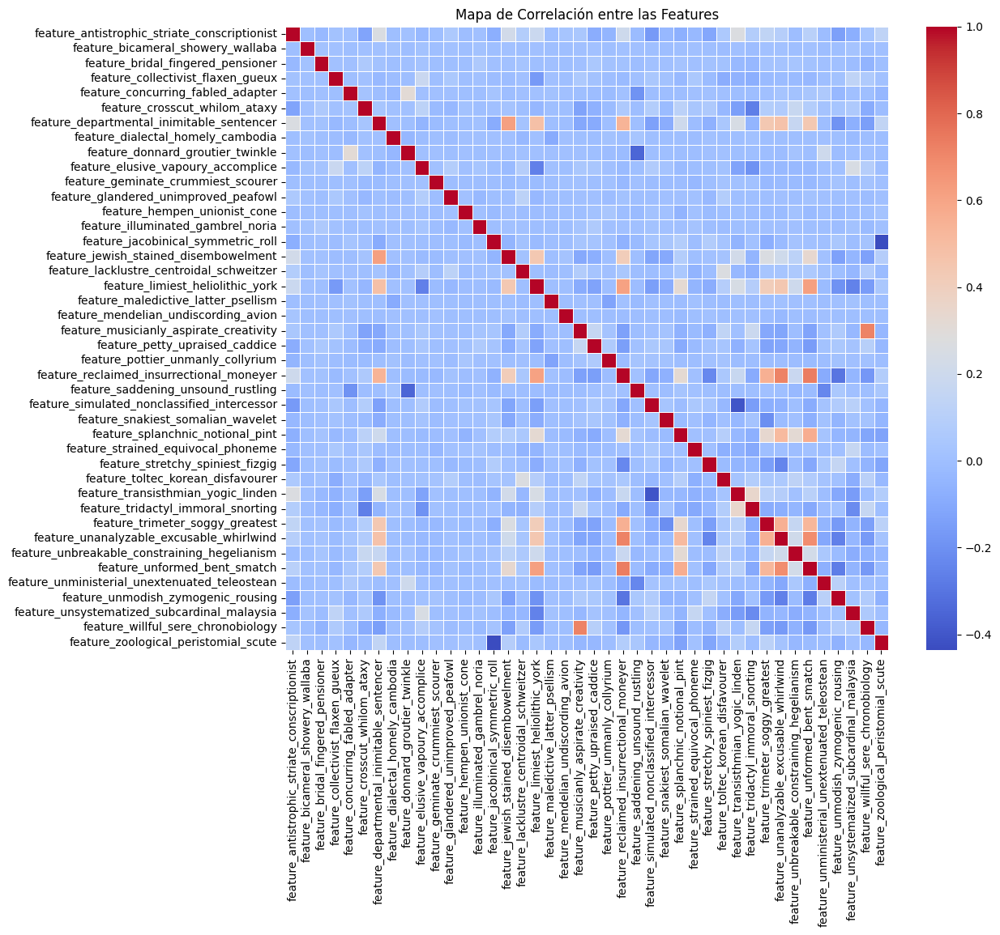

In [9]:
import seaborn as sns

import matplotlib.pyplot as plt

# Calcula la matriz de correlación
corr_matrix = train[feature_cols].corr()

# Genera el mapa de calor
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm', linewidths=0.5)
plt.title('Mapa de Correlación entre las Features')
plt.show()

In [10]:
# Top 10 de las features más correlacionadas
top_correlated_features = corr_matrix.unstack().sort_values(ascending=False)
top_correlated_features = top_correlated_features[top_correlated_features != 1]
print(f'Top 10 de las features más correlacionadas:\n{top_correlated_features[:10]}')

Top 10 de las features más correlacionadas:
feature_reclaimed_insurrectional_moneyer   feature_unformed_bent_smatch                 0.735701
feature_unformed_bent_smatch               feature_reclaimed_insurrectional_moneyer     0.735701
feature_musicianly_aspirate_creativity     feature_willful_sere_chronobiology           0.718881
feature_willful_sere_chronobiology         feature_musicianly_aspirate_creativity       0.718881
feature_reclaimed_insurrectional_moneyer   feature_unanalyzable_excusable_whirlwind     0.715344
feature_unanalyzable_excusable_whirlwind   feature_reclaimed_insurrectional_moneyer     0.715344
                                           feature_unformed_bent_smatch                 0.683997
feature_unformed_bent_smatch               feature_unanalyzable_excusable_whirlwind     0.683997
feature_departmental_inimitable_sentencer  feature_jewish_stained_disembowelment        0.615407
feature_jewish_stained_disembowelment      feature_departmental_inimitable_sentence

In [11]:
# Top 10 de las features más inversamente correlacionadas
top_inversely_correlated_features = corr_matrix.unstack().sort_values(ascending=True)
print(f'Top 10 de las features más inversamente correlacionadas:\n{top_inversely_correlated_features[:10]}')

Top 10 de las features más inversamente correlacionadas:
feature_jacobinical_symmetric_roll           feature_zoological_peristomial_scute          -0.435828
feature_zoological_peristomial_scute         feature_jacobinical_symmetric_roll            -0.435828
feature_transisthmian_yogic_linden           feature_simulated_nonclassified_intercessor   -0.402616
feature_simulated_nonclassified_intercessor  feature_transisthmian_yogic_linden            -0.402616
feature_donnard_groutier_twinkle             feature_saddening_unsound_rustling            -0.348064
feature_saddening_unsound_rustling           feature_donnard_groutier_twinkle              -0.348064
feature_unmodish_zymogenic_rousing           feature_reclaimed_insurrectional_moneyer      -0.296712
feature_reclaimed_insurrectional_moneyer     feature_unmodish_zymogenic_rousing            -0.296712
feature_unmodish_zymogenic_rousing           feature_unformed_bent_smatch                  -0.271576
feature_unformed_bent_smatch      

### Reducir la dimensionalidad

#### Eliminar columnas de baja varianza/desviación tipica

In [12]:
from sklearn.feature_selection import VarianceThreshold

# Si la varianza es menor que 0.1, descartar la feature
# Para que empiece a descartar features hay que subir hasta 1.4 lo cual es una varianza muy alta 
# que no debería ser descartada
selector = VarianceThreshold(threshold=0.1)

# Ajustar y transformar los datos
X_reducido = selector.fit_transform(train)

In [13]:
# La columna eliminada es target
print(f"El conjunto de datos de entrenamiento reducido tiene {X_reducido.shape[1]} columnas.")
print(f"El conjunto de datos de entrenamiento sin reducir tiene {train.shape[1]} columnas. 🤡")

El conjunto de datos de entrenamiento reducido tiene 43 columnas.
El conjunto de datos de entrenamiento sin reducir tiene 44 columnas. 🤡


#### Eliminar columnas "relacionadas"

El top 10 de nuestras caracteristicas más relacionadas presenta valors moderados. Podemos deducir que no hau mucha correlación estre nuestros features.  

Podemos probar a eliminar las características más correlacionadas para ver como afecta a nuestro modelo.

In [14]:
# Umbral de correlación
umbral = 0.60

# Encontrar características altamente correlacionadas
correlated_features = set()
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i, j]) > umbral:
            colname = corr_matrix.columns[i]
            correlated_features.add(colname)

# Eliminar características altamente correlacionadas
df_reducido_corrMatrix = train.drop(columns=correlated_features).copy()

print("Características eliminadas por alta correlación:")
print(correlated_features)

Características eliminadas por alta correlación:
{'feature_willful_sere_chronobiology', 'feature_jewish_stained_disembowelment', 'feature_unanalyzable_excusable_whirlwind', 'feature_reclaimed_insurrectional_moneyer', 'feature_unformed_bent_smatch'}


In [15]:
print(f"El conjunto de datos de entrenamiento reducido tiene {df_reducido_corrMatrix.shape[1]} columnas.")
print(f"El conjunto de datos de entrenamiento original tiene {train.shape[1]} columnas.")

El conjunto de datos de entrenamiento reducido tiene 39 columnas.
El conjunto de datos de entrenamiento original tiene 44 columnas.


#### Eliminar Outliers 

##### Ejemplo clásico

In [18]:
# Calcular el IQR para cada columna
Q1 = train_featurasYtarget.quantile(0.25)
Q3 = train_featurasYtarget.quantile(0.75)
IQR = Q3 - Q1

# Definir los límites para detectar outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Detectar outliers
outliers_iqr = ((train_featurasYtarget < lower_bound) | (train_featurasYtarget > upper_bound))

# Número de outliers por columna
num_outliers = outliers_iqr.sum()

# Número total de outliers
total_outliers = num_outliers.sum()

print(f"El conjunto de datos de entrenamiento tiene {total_outliers} outliers.")
print("Número de outliers por columna:")

for column, num in num_outliers.items():
    if num > 0:
        print(f"{column}: {num}")
        

El conjunto de datos de entrenamiento tiene 365478 outliers.
Número de outliers por columna:
feature_bicameral_showery_wallaba: 331401
target: 34077


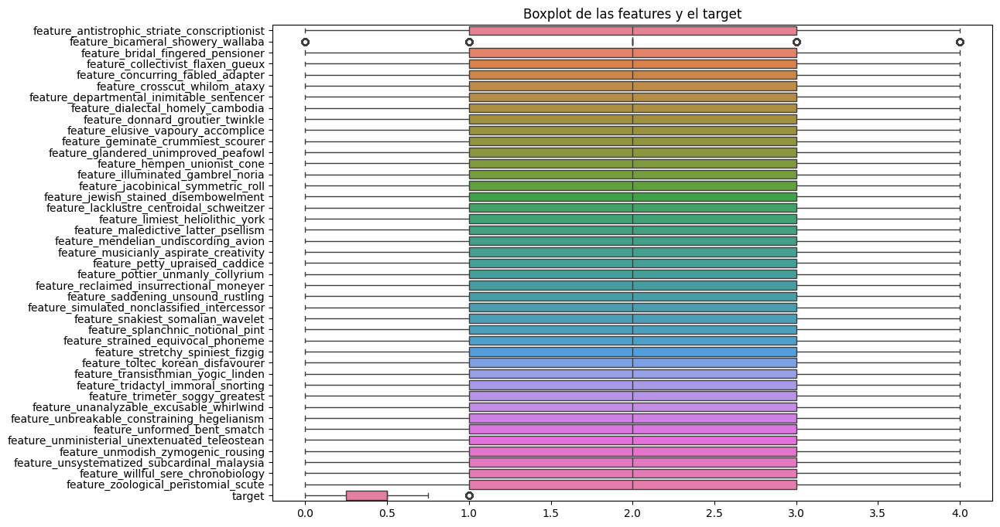

In [19]:
# plot de los outliers con boxplot
plt.figure(figsize=(12, 8))
sns.boxplot(data=train_featurasYtarget, orient='h')
plt.title('Boxplot de las features y el target')
plt.show()


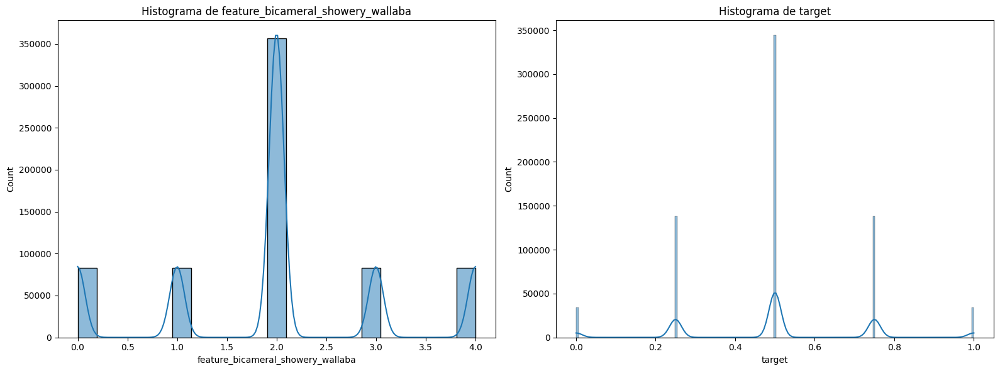

In [20]:
# histograma de los outliers
# Crear una figura con dos subgráficos (1 fila, 2 columnas)
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Primer histograma
sns.histplot(train_featurasYtarget["feature_bicameral_showery_wallaba"], kde=True, ax=axes[0])
axes[0].set_title('Histograma de feature_bicameral_showery_wallaba')

# Segundo histograma
sns.histplot(train_featurasYtarget["target"], kde=True, ax=axes[1])
axes[1].set_title('Histograma de target')

# Mostrar la figura
plt.tight_layout()
plt.show()

Como podemos ver no tiene sentodo eliminar los outliers en estos 2 casos. Si quisieramos hacerlo podríamos eliminar solo los resultados del percentil 10 y los que estan por encima del percentil 90 para eliminar los resultados más extremos, pero tampoco parece buena idea.

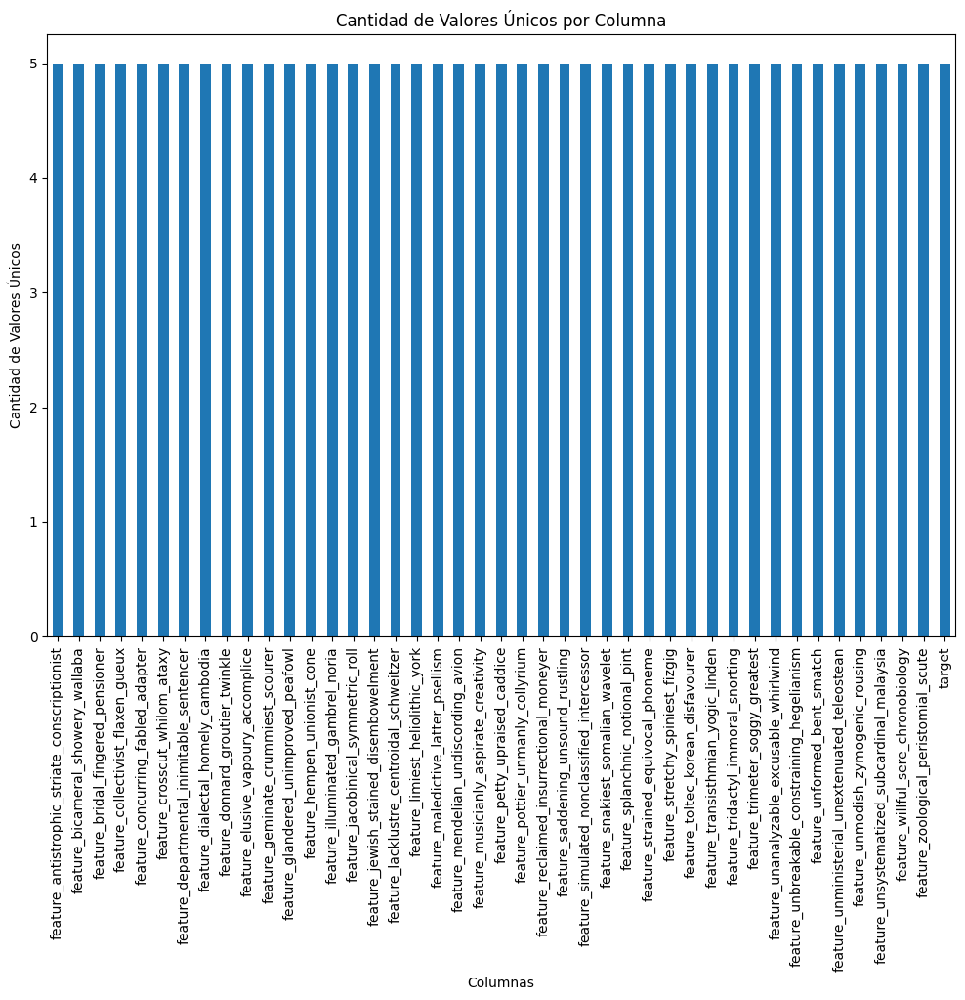

In [21]:
# Calcular la cantidad de valores únicos por cada columna
valores_unicos_por_columna = train_featurasYtarget.nunique()

# Crear una gráfica de barras
plt.figure(figsize=(12, 8))
valores_unicos_por_columna.plot(kind='bar')
plt.title('Cantidad de Valores Únicos por Columna')
plt.xlabel('Columnas')
plt.ylabel('Cantidad de Valores Únicos')
plt.xticks(rotation=90)  
plt.show()

##### Ejemplo con **Método de la Distancia de Mahalanobis**  

La distancia de Mahalanobis es una medida de la distancia entre un punto y una distribución. Los puntos con una distancia de Mahalanobis alta pueden ser considerados outliers.

In [22]:
from scipy.spatial.distance import mahalanobis

# La distancia de Mahalanobis es una medida multivariante que considera la correlación 
# entre las características para identificar outliers. Detecta outliers en el contexto 
# de todas las características juntas, no individualmente por cada característica. Por 
# lo tanto, los outliers detectados por la distancia de Mahalanobis son aquellos puntos 
# que están lejos del centro de la distribución multivariante considerando todas las 
# características.

# Calcular la distancia de Mahalanobis para cada punto
mean = train_featurasYtarget.mean(axis=0)
cov_matrix = np.cov(train_featurasYtarget.values.T)
inv_cov_matrix = np.linalg.inv(cov_matrix)

mahalanobis_distances = train_featurasYtarget.apply(lambda row: mahalanobis(row, mean, inv_cov_matrix), axis=1)


In [23]:
# Definir un umbral para detectar outliers

# El umbral se define como el percentil 97.5 de la distribución de las distancias de Mahalanobis.
# Esto significa que cualquier punto con una distancia de Mahalanobis mayor que el percentil 97.5
# se considera un outlier.
threshold = np.percentile(mahalanobis_distances, 97.5)

# Detectar outliers
outliers_mahalanobis = mahalanobis_distances > threshold

# Nuevo dataframe sin outliers
df_reducido_mahalanobis = train[~outliers_mahalanobis].copy()


In [24]:
# Número de outliers totales
num_outliers_mahalanobis = outliers_mahalanobis.sum()
print(f"El conjunto de datos de entrenamiento tiene {num_outliers_mahalanobis} outliers detectados por la distancia de Mahalanobis.")

El conjunto de datos de entrenamiento tiene 17205 outliers detectados por la distancia de Mahalanobis.


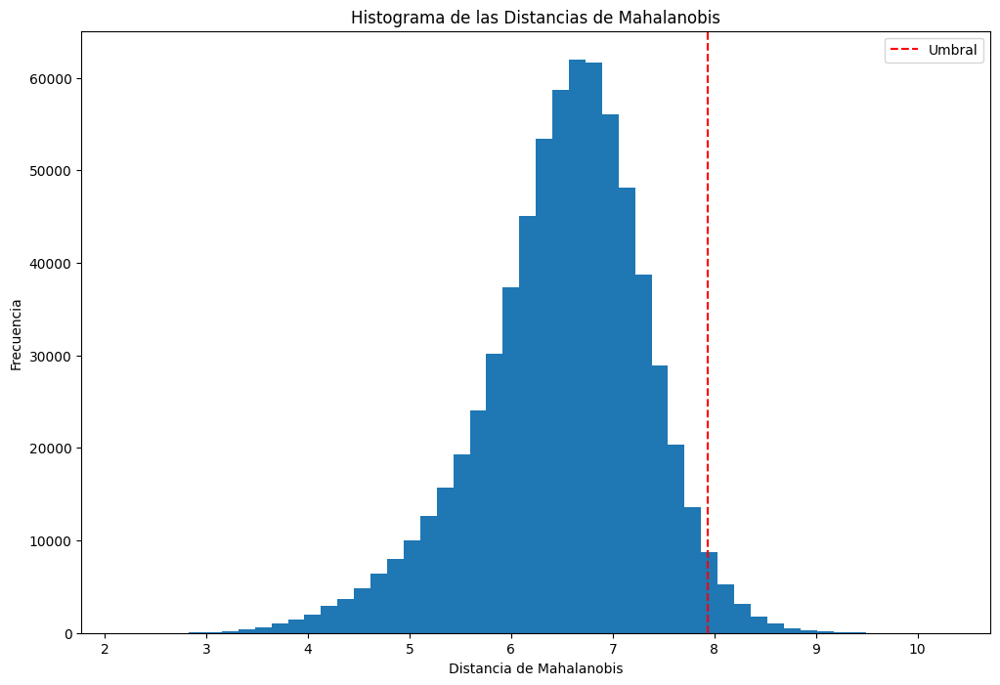

In [25]:
# plot de los outliers detectados por la distancia de Mahalanobis
plt.figure(figsize=(12, 8))
plt.hist(mahalanobis_distances, bins=50)
plt.axvline(threshold, color='r', linestyle='--', label='Umbral')
plt.title('Histograma de las Distancias de Mahalanobis')
plt.xlabel('Distancia de Mahalanobis')
plt.ylabel('Frecuencia')
plt.legend()
plt.show()

##### Ejemplo con **Isolation Forest**

Isolation Forest es un algoritmo de machine learning para detectar outliers.

In [26]:
from sklearn.ensemble import IsolationForest

# Isolation Forest es un algoritmo de detección de outliers que funciona construyendo
# un bosque de árboles aleatorios y calculando la profundidad de los puntos en el bosque.
# Los puntos que son más profundos en el bosque (es decir, requieren menos divisiones para
# ser aislados) se consideran outliers.

iso_forest = IsolationForest(contamination=0.025)  # 2.5% de los datos serán considerados outliers
outliers_IsolationForest = iso_forest.fit_predict(train_featurasYtarget)


In [27]:
# Nuevo dataframe sin los outliers
df_reducido_IsolationForest = train[~outliers_IsolationForest.astype(bool)]

In [28]:
# Número de outliers detectados
num_outliers_IsolationForest = (outliers_IsolationForest == -1).sum()
print(f"El conjunto de datos de entrenamiento tiene {num_outliers_IsolationForest} outliers detectados por Isolation Forest.")

El conjunto de datos de entrenamiento tiene 17205 outliers detectados por Isolation Forest.


`Genero los df reducidos pero no creo que los resultados vayan a ser significativamente mejores`

#### PCA

Teniendo en cuenta la poca correlacion que hemos visto entre los valores podemos intuir que se ha hecho ya un PCA pero vamos a probar a hacer uno de todas formas

In [29]:
# Aplicamos el PCA para reducir la dimensionalidad de los datos
from sklearn.decomposition import PCA

# Número de componentes principales. De 40 a 30
n_components = 30

# Inicializar PCA
pca = PCA(n_components=n_components)

# Ajustar y transformar los datos (sin la columna target)
df_reducido_pca30 = pca.fit_transform(train_featurasYtarget.drop(columns='target'))


In [30]:
# Transformamos a un DataFrame
df_reducido_pca30 = pd.DataFrame(df_reducido_pca30)
df_reducido_pca30['target'] = train_featurasYtarget['target'].values
df_reducido_pca30.head()

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,target
0,-3.080581,2.185149,0.553756,-0.377077,-0.076288,-0.203146,-0.709012,1.239604,-0.060685,-0.020314,...,2.194083,-1.082534,-0.128352,0.014603,0.181666,-1.010050,0.868656,0.111899,0.099009,0.25
1,-3.575384,1.347758,-1.302538,1.729251,0.475822,0.045834,1.352107,0.809854,-0.250192,-1.055343,...,2.569488,-1.013556,0.547047,-1.122627,-1.857438,0.514726,-0.924487,-0.215911,0.176642,0.25
2,-0.938700,2.668238,-0.019032,-0.708215,-0.244425,-0.229871,-0.606050,0.225554,0.974065,-0.361710,...,-1.023249,0.945506,0.039744,-1.832852,-0.617559,0.612924,-0.498575,-0.283233,0.150913,0.75
3,3.102844,-1.883007,-2.447858,0.138986,-0.000426,-0.776114,1.957360,-0.431502,0.278426,-0.169068,...,-0.382264,0.190189,0.913476,0.621487,0.447046,-0.111104,-0.979836,0.690788,-0.207463,0.25
4,-4.481653,1.733175,0.330882,0.599528,-0.416985,-1.287631,0.251523,0.137200,-0.785705,-1.332157,...,-1.078259,-0.330492,-0.663689,0.974062,0.265037,-0.817817,-1.689802,0.715666,0.286744,0.25


#### Scaler 

Teniendo en cuenta la poca correlacion que hemos visto entre los valores podemos intuir que se ha hecho ya un escalado (MinMaxScaler de 0 a 4) pero vamos a probar a hacer uno de todas formas

In [31]:
from sklearn.preprocessing import RobustScaler

scaler = RobustScaler()

# Ajustar y transformar los datos sin la columna 'era'
train_featurasYtarget_scaled = scaler.fit_transform(train.drop(columns=['era']))

# Transformar a un DataFrame
train_featurasYtarget_scaled = pd.DataFrame(train_featurasYtarget_scaled, columns=train.drop(columns=['era']).columns)

# Añadir la columna 'era' al DataFrame escalado
train_featurasYtarget_scaled['era'] = train['era'].values

# Reordenar las columnas para que 'era' sea la primera columna
train_scaled = train_featurasYtarget_scaled[['era'] + list(train_featurasYtarget_scaled.columns[:-1])]

In [32]:
train_scaled.describe()

,target,feature_antistrophic_striate_conscriptionist,feature_bicameral_showery_wallaba,feature_bridal_fingered_pensioner,feature_collectivist_flaxen_gueux,feature_concurring_fabled_adapter,feature_crosscut_whilom_ataxy,feature_departmental_inimitable_sentencer,feature_dialectal_homely_cambodia,feature_donnard_groutier_twinkle,...,feature_tridactyl_immoral_snorting,feature_trimeter_soggy_greatest,feature_unanalyzable_excusable_whirlwind,feature_unbreakable_constraining_hegelianism,feature_unformed_bent_smatch,feature_unministerial_unextenuated_teleostean,feature_unmodish_zymogenic_rousing,feature_unsystematized_subcardinal_malaysia,feature_willful_sere_chronobiology,feature_zoological_peristomial_scute
count,688184.000000,688184.000000,688184.000000,688184.000000,688184.000000,688184.000000,688184.000000,688184.000000,688184.000000,688184.000000,...,688184.000000,688184.000000,688184.000000,688184.000000,688184.000000,688184.000000,688184.000000,688184.000000,688184.000000,688184.000000
mean,0.000031,-0.000042,-0.000049,-0.000032,-0.000035,-0.000032,-0.000045,-0.000045,-0.000032,-0.000032,...,-0.000045,-0.000045,-0.000045,-0.000045,-0.000045,-0.000032,-0.000035,-0.000045,-0.000045,-0.000042
std,0.892593,0.700781,1.097296,0.656264,0.686876,0.661015,0.707176,0.707176,0.661015,0.661015,...,0.707176,0.707176,0.707176,0.707176,0.707176,0.661015,0.686876,0.707176,0.707176,0.700781
min,-2.000000,-1.000000,-2.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
25%,-1.000000,-0.500000,0.000000,-0.500000,-0.500000,-0.500000,-0.500000,-0.500000,-0.500000,-0.500000,...,-0.500000,-0.500000,-0.500000,-0.500000,-0.500000,-0.500000,-0.500000,-0.500000,-0.500000,-0.500000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.500000,0.000000,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000,...,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000
max,2.000000,1.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


###
---
---
---

ERAS:

Como se mencionó anteriormente, cada "era" corresponde a una fecha diferente. Cada "era" tiene exactamente una semana de diferencia.

Es útil pensar en filas de acciones dentro de la misma "era" como un solo ejemplo. A lo largo de este notebook hablaremos de cosas "por era". Por ejemplo, el número de filas por "era" representa el conjunto de acciones (stocks) dentro de las posibilidades de inversión de algún fondo en esa fecha.

<Axes: title={'center': 'Number of rows per era'}, xlabel='Era'>

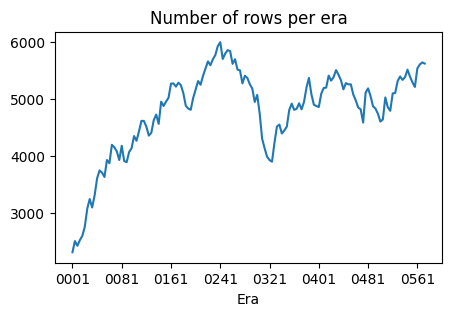

In [33]:
# Muestra el número de filas por era
train.groupby("era").size().plot(title="Number of rows per era", figsize=(5, 3), xlabel="Era")

# import matplotlib.pyplot as plt

# train.groupby("era").size().plot(kind="bar", figsize=(5, 3))
# plt.title("Number of rows per era")
# plt.xlabel("Era")
# plt.ylabel("Count")
# plt.show()


FEATURES:

Como se mencionó anteriormente, las características son atributos cuantitativos de cada acción: fundamentos como la relación P/E (precio/beneficio), señales técnicas como el RSI, datos de mercado como el interés a corto, datos secundarios como las calificaciones de los analistas y mucho más.

La definición subyacente de cada característica no es importante, solo debes saber que se han incluido estas características en el conjunto de datos porque se cree que pueden ser relevantes para predecir el "target".

In [34]:
# Número de características
len(feature_cols)

42

Los valores de las características se agrupan en 5 contenedores iguales: 0, 1, 2, 3, 4. Esta fuerte estandarización de los valores de las características tiene como objetivo evitar el overfitting, ya que los valores subyacentes son extremadamente ruidosos.

Si faltan datos de una característica particular para esa era (más común en las primeras eras), todos los valores se establecen en 2.


<Axes: title={'center': 'missing data'}, ylabel='Frequency'>

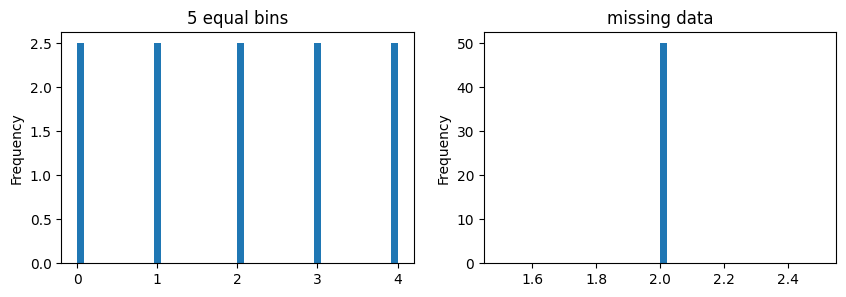

In [35]:
# Compara la distribución de una característica particular (feature_cols[-1]) entre dos períodos diferentes (first_era y last_era) en el conjunto de datos train.
import matplotlib.pyplot as plt
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3))
first_era = train[train["era"] == train["era"].unique()[0]]
last_era = train[train["era"] == train["era"].unique()[-1]]
last_era[feature_cols[-1]].plot(kind="hist", title="5 equal bins", density=True, bins=50, ax=ax1)
first_era[feature_cols[-1]].plot(kind="hist", title="missing data", density=True, bins=50, ax=ax2)

TARGET:

El "target" es una medida de los rendimientos del mercado de valores a 20 días (hábiles). Específicamente, es una medida de rendimientos "específicos de acciones" que no se "explican" por tendencias más amplias en el mercado, país, sector o "factores" bien conocidos. Por ejemplo, si Apple subió y el sector tecnológico también subió, solo queremos saber si Apple subió más o menos que el sector tecnológico.

Los valores del "target" se agrupan en 5 contenedores desiguales: 0, 0,25, 0,5, 0,75, 1,0. Nuevamente, esta fuerte estandarización de los valores de target tiene como objetivo evitar el overfitting, ya que los valores subyacentes son extremadamente ruidosos.

<Axes: title={'center': 'Target'}, xlabel='Value', ylabel='Frequency'>

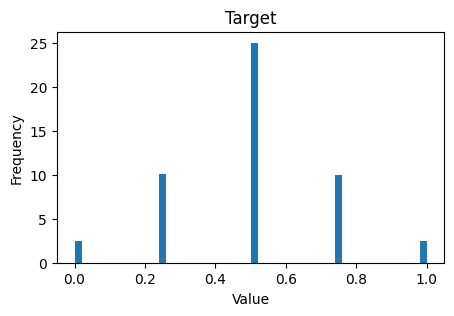

In [36]:
# Histograma (densidad) de "target"
train["target"].plot(kind="hist", title="Target", figsize=(5, 3), xlabel="Value", density=True, bins=50)

## 2.- MODELING

Entrenamiento del modelo:

Eres libre de utilizar cualquier algoritmo visto en clase. Pero, en este ejemplo, usaremos LGBMRegressor, basado en árboles de decisión para predecir variables continuas. Es una opción popular para las predicciones de este tipo. En cuanto a los mejores hiperparámetros, estos son solo una base, haz un grid.

In [37]:
# https://lightgbm.readthedocs.io/en/latest/pythonapi/lightgbm.LGBMRegressor.html 
import lightgbm as lgb #En mi mac, tuve que instalar libomp: "brew install libomp"

# https://lightgbm.readthedocs.io/en/latest/Parameters-Tuning.html
model = lgb.LGBMRegressor(
  n_estimators=2000,
  learning_rate=0.01,
  max_depth=5,
  num_leaves=2**5-1,
  colsample_bytree=0.1
)

# This will take a few minutes 🍵
model.fit(
  train[feature_cols],
  train["target"]
)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002077 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 210
[LightGBM] [Info] Number of data points in the train set: 688184, number of used features: 42
[LightGBM] [Info] Start training from score 0.500008


LGBMRegressor(colsample_bytree=0.1, learning_rate=0.01, max_depth=5,
              n_estimators=2000)

Ahora hagamos algunas predicciones con los datos de validación para evaluar el rendimiento de nuestro modelo.

In [89]:
# Descarga validation data 
# Esto tomará unos pocos minutos 🍵
### napi.download_dataset("v5.0/validation.parquet")

# Carga el validation data, filtrando por data_type == "validation"
validation = pd.read_parquet("v5.0/validation.parquet", columns=["era", "data_type", "target"] + feature_cols) 
validation = validation[validation["data_type"] == "validation"]
del validation["data_type"]

# Reduce la muestra a cada cuarta era para reducir el uso de memoria y acelerar la evaluación
# Comenta la siguiente línea para usar todos los datos (mayor uso de memoria, inferencia más lenta, evaluación más precisa)
validation = validation[validation["era"].isin(validation["era"].unique()[::4])]

# Las eras están separadas por una semana, pero los "targets" miran 4 semanas en el futuro, por lo que debemos "embargar" las 4 eras posteriores a nuestra última "era" para evitar fuga de datos.
last_train_era = int(train["era"].unique()[-1])
eras_to_embargo = [str(era).zfill(4) for era in [last_train_era + i for i in range(4)]]
validation = validation[~validation["era"].isin(eras_to_embargo)]

# Genera predicciones respecto a las características de validación fuera de la muestra.
# Esto tomará unos pocos minutos 🍵
validation["prediction"] = model.predict(validation[feature_cols])
validation[["era", "prediction", "target"]]

,era,prediction,target
id,,,
n000c290e4364875,0579,0.494547,0.50
n002a15bc5575bbb,0579,0.517560,0.25
n00309caaa0f955e,0579,0.515683,0.75
n0039cbdcf835708,0579,0.509313,0.50
n004143458984f89,0579,0.483896,0.50
...,...,...,...
nffc7d5c3bb883aa,1135,0.509634,0.25
nffd2ddf669b3c4c,1135,0.494992,0.25
nffd838736b2cb68,1135,0.487602,0.50


---
---
---
MIO

### Train Test

Aqui al ser series temporales no podemos dividir el dataset a lo loco porque que mantener la seciencia temporal de los datos, el modelo no purde tener datos del futuro para entrenar, esto puede llevar a overfitting a la hora de evaluar el rendimiento. Al dividir los datos de esta manera también hacemos que la validación sea mejor porque estamos probando el modelo en diferentes puntos del tiempo.

In [38]:
# Dividimos el conjunto de datos OG train en dos: train y test

from sklearn.model_selection import TimeSeriesSplit

# Definir las características (X) y el objetivo (y)
X = train[feature_cols]
y = train["target"]

# Crear un objeto TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=5)
# Split 1: | Train  | Test |    |      |    |      |
# Split 2: | Train  | Train|    | Test |    |      |
# Split 3: | Train  | Train|    | Train|    | Test |
# ...

# Iterar sobre los splits
for train_index, test_index in tscv.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    # Aquí puedes entrenar y evaluar tu modelo en cada split
    print("Tamaño del conjunto de entrenamiento:", len(X_train))
    print("Tamaño del conjunto de prueba:", len(X_test))


Tamaño del conjunto de entrenamiento: 114699
Tamaño del conjunto de prueba: 114697
Tamaño del conjunto de entrenamiento: 229396
Tamaño del conjunto de prueba: 114697
Tamaño del conjunto de entrenamiento: 344093
Tamaño del conjunto de prueba: 114697
Tamaño del conjunto de entrenamiento: 458790
Tamaño del conjunto de prueba: 114697
Tamaño del conjunto de entrenamiento: 573487
Tamaño del conjunto de prueba: 114697


In [39]:
from sklearn.model_selection import TimeSeriesSplit
from scipy.stats import pearsonr

def corr_score(y_true, y_pred):
    return pearsonr(y_true, y_pred)[0]

def evaluate_model(model, x_data, y_data, splits=5 ):
    tscv = TimeSeriesSplit(n_splits=splits)
    scores = []
    for train_index, test_index in tscv.split(x_data):
        x_train, x_test = x_data.iloc[train_index], x_data.iloc[test_index]
        y_train, y_test = y_data.iloc[train_index], y_data.iloc[test_index]
        
        model.fit(x_train, y_train)
        score = corr_score(y_test, model.predict(x_test))
        scores.append(score)
    return scores


### XGBoost

Es un metodo de gradient boosting 

In [ ]:
from xgboost import XGBRegressor

xgBoost_model = XGBRegressor()
xgBoost_model.fit(train[feature_cols], train["target"])


### CatBoost

In [ ]:
# from catboost import CatBoostRegressor

# catBoost_model = CatBoostRegressor()
# catBoost_model.fit(train[feature_cols], train["target"])

### RandomForest

Bastante lento

In [ ]:
# from sklearn.ensemble import RandomForestRegressor

# randomForest_model = RandomForestRegressor()
# randomForest_model.fit(train[feature_cols], train["target"])

### SVR

Extremadamente lento en entrenamiento 

In [ ]:
# from sklearn.svm import SVR

# svr_model = SVR()
# svr_model.fit(train[feature_cols], train["target"])


### Stacking

In [ ]:
from sklearn.ensemble import StackingRegressor

# Apilar los modelos
stacked_model = StackingRegressor(
  estimators=[("lgbm", model), 
              ("xgboost", xgBoost_model), 
              ],
)

### Optunizar XGBoost

Los datos de bolsa suelen ser ruidosos y tener patrones débiles, por lo que enfoques conservadores (como tasas de aprendizaje bajas, profundidad moderada y subsampling) ayudan a evitar el sobreajuste.

In [63]:
import xgboost as xgb 
import numpy as np
import optuna

X = train[feature_cols]
y = train["target"]

def objective(trial):
    # Define los hiperparámetros a optimizar
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 1000, 15000),
        "learning_rate": trial.suggest_float("learning_rate", 0.0001, 0.05),
        "max_depth": trial.suggest_int("max_depth", 3, 25),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.3, 1),
        "gamma": trial.suggest_float("gamma", 0.0, 1.0),
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 20),
        "reg_alpha": trial.suggest_float("reg_alpha", 0.0, 1.0),
        "reg_lambda": trial.suggest_float("reg_lambda", 0.0, 1.0),
    }

    # Inicializa el modelo
    model = xgb.XGBRegressor(verbosity=0, use_label_encoder=False, n_jobs = -1, **params)

    # Evalúa el modelo
    scores = evaluate_model(model, X, y)

    # Devuelve la media de los scores
    return np.mean(scores)


In [36]:
storage = optuna.storages.RDBStorage("sqlite:///XGBRegressor_study.db")

In [39]:
study = optuna.create_study(direction="maximize", storage=storage, load_if_exists=True)


[I 2024-12-07 16:17:34,981] A new study created in RDB with name: no-name-f74c8740-9dec-403d-86ba-77ee737b2c12


In [41]:
study.optimize(objective, n_trials=100)

[I 2024-12-07 16:20:29,684] Trial 1 finished with value: 0.026608791061463556 and parameters: {'n_estimators': 4763, 'learning_rate': 0.012332979976226559, 'max_depth': 11, 'subsample': 0.9698689296146467, 'colsample_bytree': 0.7404035193526947, 'gamma': 0.5813810793215869, 'min_child_weight': 8, 'reg_alpha': 0.3464316912988915, 'reg_lambda': 0.6884388637721326}. Best is trial 1 with value: 0.026608791061463556.
[I 2024-12-07 16:21:03,594] Trial 2 finished with value: 0.02851034423855599 and parameters: {'n_estimators': 1212, 'learning_rate': 0.04694743801686787, 'max_depth': 14, 'subsample': 0.8491357202320753, 'colsample_bytree': 0.7250860433571078, 'gamma': 0.5404140569529808, 'min_child_weight': 3, 'reg_alpha': 0.8151116834126577, 'reg_lambda': 0.48563103796875173}. Best is trial 2 with value: 0.02851034423855599.
[I 2024-12-07 16:22:45,804] Trial 3 finished with value: 0.030114501367086387 and parameters: {'n_estimators': 3011, 'learning_rate': 0.013356262901922534, 'max_depth': 1

In [47]:
import optuna.visualization as vis

# Visualiza los resultados
optuna.visualization.plot_optimization_history(study)


In [48]:
# # Visualiza la importancia de los hiperparámetros
optuna.visualization.plot_param_importances(study)

In [49]:
# # Visualiza la importancia de los hiperparámetros
optuna.visualization.plot_slice(study)

In [50]:
# # Visualiza la importancia de los hiperparámetros
optuna.visualization.plot_parallel_coordinate(study)

In [46]:
# # Visualiza la importancia de los hiperparámetros
optuna.visualization.plot_contour(study)

### Optunizar LGBMRegressor

In [ ]:
# con LGBMRegressor

import optuna
import lightgbm as lgb
import numpy as np

X = train[feature_cols]
y = train["target"]


def objective(trial):
    # Define los hiperparámetros a optimizar
    params = {
    "n_estimators": trial.suggest_int("n_estimators", 100, 10000),
    "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.2),
    "max_depth": trial.suggest_int("max_depth", 3, 25),
    "num_leaves": trial.suggest_int("num_leaves", 20, 256),
    "colsample_bytree": trial.suggest_float("colsample_bytree", 0.3, 1),
    "subsample": trial.suggest_float("subsample", 0.5, 1.0),
    "min_split_gain": trial.suggest_float("min_split_gain", 0.0, 0.1),
    "min_child_weight": trial.suggest_int("min_child_weight", 5, 50),
    "reg_alpha": trial.suggest_float("reg_alpha", 0.0, 1.0),
    "reg_lambda": trial.suggest_float("reg_lambda", 0.0, 5.0),
    }

    # Inicializa el modelo
    model = lgb.LGBMRegressor(verbosity=-1, **params, n_jobs=-1)

    scores = []

    scores = evaluate_model(model, X, y)

    # Devuelve la media de los scores
    return np.mean(scores)


In [56]:
storage = optuna.storages.RDBStorage("sqlite:///LGBMRegressor_study.db")

In [57]:

study = optuna.create_study(direction="maximize", storage=storage, load_if_exists=True)
study.optimize(objective, n_trials=100)

[I 2024-12-08 05:04:35,370] A new study created in RDB with name: no-name-47abb6b5-a56f-453f-8947-e1aa0539b806
[I 2024-12-08 05:06:06,610] Trial 0 finished with value: 0.028363511127451203 and parameters: {'n_estimators': 6319, 'learning_rate': 0.107250943933544, 'max_depth': 5, 'num_leaves': 63, 'colsample_bytree': 0.7129022955572456, 'subsample': 0.5029328930989044, 'min_split_gain': 0.028451946705583233, 'min_child_weight': 38, 'reg_alpha': 0.059215165679786685, 'reg_lambda': 3.365306810186709}. Best is trial 0 with value: 0.028363511127451203.
[I 2024-12-08 05:07:48,202] Trial 1 finished with value: 0.022477223153297202 and parameters: {'n_estimators': 7590, 'learning_rate': 0.19076084393312523, 'max_depth': 25, 'num_leaves': 129, 'colsample_bytree': 0.6719168146688352, 'subsample': 0.9057847632534686, 'min_split_gain': 0.052739483919312914, 'min_child_weight': 9, 'reg_alpha': 0.49070456003466434, 'reg_lambda': 2.9860169639656324}. Best is trial 0 with value: 0.028363511127451203.


In [61]:
# creamos el modelo con los mejores hiperparámetros
best_params = study.best_params

LGBMRegressor_model_best = lgb.LGBMRegressor(verbosity=-1, **best_params, n_jobs=-1)

In [59]:
optuna.visualization.plot_optimization_history(study)


In [58]:
optuna.visualization.plot_param_importances(study)


### Predicciones con los modelos

In [2]:
import xgboost as xgb
import lightgbm as lgb

# Los mejores resultados para cada modelo

# LGBM
# [I 2024-12-08 06:13:25,062] Trial 82 finished with value: 0.03364725535957263 and parameters: {'n_estimators': 712, 'learning_rate': 0.03675431495496091, 'max_depth': 3, 'num_leaves': 166, 'colsample_bytree': 0.5648853635979697, 'subsample': 0.8235392744308611, 'min_split_gain': 0.0003091886296351272, 'min_child_weight': 34, 'reg_alpha': 0.6398474685604615, 'reg_lambda': 2.274261308467464}. Best is trial 82 with value: 0.03364725535957263.

# XGB
# [I 2024-12-07 23:43:47,877] Trial 78 finished with value: 0.03479544945120395 and parameters: {'n_estimators': 14095, 'learning_rate': 0.00598631191872232, 'max_depth': 11, 'subsample': 0.6265992148691241, 'colsample_bytree': 0.3876171230226296, 'gamma': 0.2775916190443488, 'min_child_weight': 16, 'reg_alpha': 0.5288161647966741, 'reg_lambda': 0.9610734857146259}. Best is trial 78 with value: 0.03479544945120395.

# XGB
params_XGB = {
    "n_estimators": 14095,
    "learning_rate": 0.00598631191872232,
    "max_depth": 11,
    "subsample": 0.6265992148691241,
    "colsample_bytree": 0.3876171230226296,
    "gamma": 0.2775916190443488,
    "min_child_weight": 16,
    "reg_alpha": 0.5288161647966741,
    "reg_lambda": 0.9610734857146259,
}
XGBRegressor_model_best = xgb.XGBRegressor(verbosity=0, use_label_encoder=False, n_jobs = -1, **params_XGB)

# LGBM
params_LGBM = {
    "n_estimators": 712,
    "learning_rate": 0.03675431495496091,
    "max_depth": 3,
    "num_leaves": 166,
    "colsample_bytree": 0.5648853635979697,
    "subsample": 0.8235392744308611,
    "min_split_gain": 0.0003091886296351272,
    "min_child_weight": 34,
    "reg_alpha": 0.6398474685604615,
    "reg_lambda": 2.274261308467464,
}
LGBMRegressor_model_best = lgb.LGBMRegressor(verbosity=-1, **params_LGBM, n_jobs=-1)

In [6]:
XGBRegressor_model_best.fit(train[feature_cols], train["target"])
LGBMRegressor_model_best.fit(train[feature_cols], train["target"])

LGBMRegressor(colsample_bytree=0.5648853635979697,
              learning_rate=0.03675431495496091, max_depth=3,
              min_child_weight=34, min_split_gain=0.0003091886296351272,
              n_estimators=712, n_jobs=-1, num_leaves=166,
              reg_alpha=0.6398474685604615, reg_lambda=2.274261308467464,
              subsample=0.8235392744308611, verbosity=-1)

In [7]:
def validate_model(model, train, feature_cols, validation_path="v5.0/validation.parquet"):
	# Carga el validation data, filtrando por data_type == "validation"
	validation = pd.read_parquet(validation_path, columns=["era", "data_type", "target"] + feature_cols) 
	validation = validation[validation["data_type"] == "validation"]
	del validation["data_type"]

	# Reduce la muestra a cada cuarta era para reducir el uso de memoria y acelerar la evaluación
	# Comenta la siguiente línea para usar todos los datos (mayor uso de memoria, inferencia más lenta, evaluación más precisa)
	validation = validation[validation["era"].isin(validation["era"].unique()[::4])]

	# Las eras están separadas por una semana, pero los "targets" miran 4 semanas en el futuro, por lo que debemos "embargar" las 4 eras posteriores a nuestra última "era" para evitar fuga de datos.
	last_train_era = int(train["era"].unique()[-1])
	eras_to_embargo = [str(era).zfill(4) for era in [last_train_era + i for i in range(4)]]
	validation = validation[~validation["era"].isin(eras_to_embargo)]

	# Genera predicciones respecto a las características de validación fuera de la muestra.
	# Esto tomará unos pocos minutos 🍵
	validation["prediction"] = model.predict(validation[feature_cols])
	return validation[["era", "prediction", "target"]]

In [8]:
validation_results_LGBM = validate_model(LGBMRegressor_model_best, train, feature_cols)

In [9]:
validation_results_XGB = validate_model(XGBRegressor_model_best, train, feature_cols)

---
---
---

## 3. Evaluación del rendimiento:

La métrica de puntuación principal que usaremos se llama CORR (practica_corr), que es una variante específica de para este caso de uso del coeficiente de correlación de Pearson.

Esta métrica está diseñada para "alinear los incentivos" entre el modelo y el desempeño de un fondo de inversión. Es decir, un modelo con una buena puntuación CORR debería ayudar a un inversor a obtener buenos rendimientos.

In [10]:
from scipy import stats
import numpy as np

# La principal métrica de scoring:
def practica_corr(preds, target):
    # clasifica (manteniendo vínculos) y luego gaussianiza las predicciones para estandarizar las distribuciones de predicción
    ranked_preds = (preds.rank(method="average").values - 0.5) / preds.count()
    gauss_ranked_preds = stats.norm.ppf(ranked_preds)
    # centra objetivos alrededor de 0
    centered_target = target - target.mean()
    # Levanta ambas predicciones y apunta a la potencia de 1,5 para acentuar las colas.
    preds_p15 = np.sign(gauss_ranked_preds) * np.abs(gauss_ranked_preds) ** 1.5
    target_p15 = np.sign(centered_target) * np.abs(centered_target) ** 1.5
    # Finalmente devuelve el Pearson correlation
    return np.corrcoef(preds_p15, target_p15)[0, 1]

Como se mencionó anteriormente, es importante calificar cada era histórica de forma independiente. Entonces, al evaluar el desempeño de nuestro modelo, deberíamos observar la corrección "por era".

Una cosa que puedes ver aquí es cómo de bajas son las puntuaciones (en el rango de +/- 5% de correlación). Esto es muy normal en el ámbito de las finanzas cuantitativas y es parte de la razón por la que se indica que es la "práctica de aprendizaje automático más difícil" del mundo.


C:\Users\David\AppData\Local\Temp\ipykernel_16300\422838571.py:2: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



<Axes: title={'center': 'Validation Correlation'}, xlabel='era'>

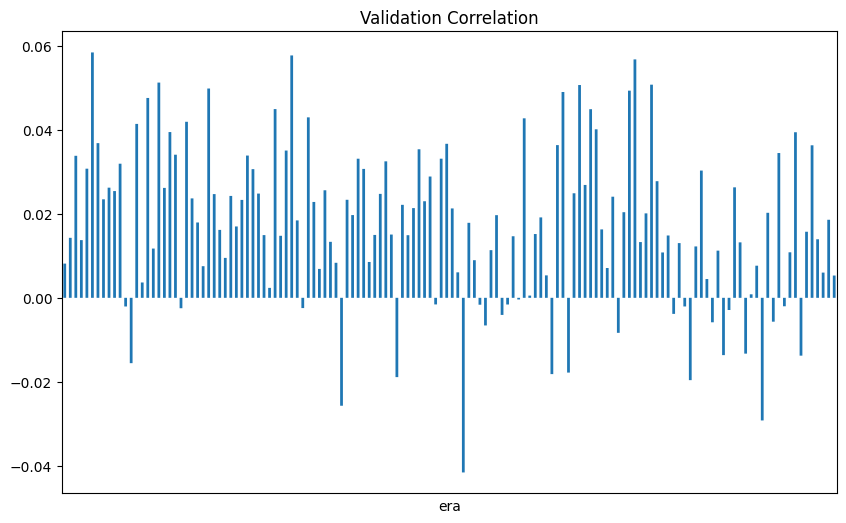

In [90]:
# Calcula la correlación por era entre nuestras predicciones y los valores "target".
per_era_corr = validation.groupby("era").apply(lambda x: practica_corr(x["prediction"], x["target"]))

# Gráfica de correlación por "era" 
per_era_corr.plot(kind="bar", title="Validation Correlation", figsize=(10, 6), xticks=[], snap=False)

En lugar de observar la puntuación "corr" de cada "era", resulta útil observar la puntuación "corr" acumulativa.

Esto se denomina "backtesting" en finanzas cuantitativas, donde las personas simulan el desempeño histórico de sus estrategias de inversión, puede considerar este gráfico como una prueba retrospectiva del desempeño de tu modelo durante el período de validación histórica.

<Axes: title={'center': 'Cumulative Validation Correlation'}, xlabel='era'>

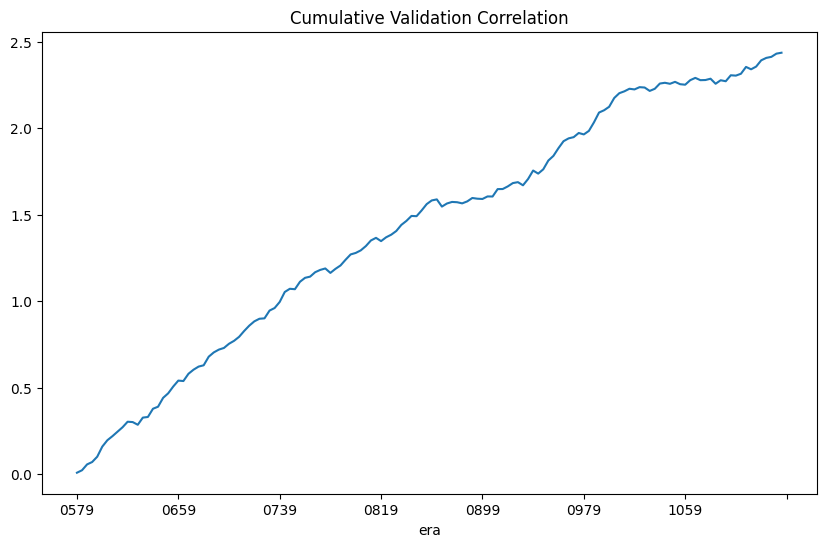

In [91]:
# Gráfica de la correlación acumulada por "era"
per_era_corr.cumsum().plot(kind="line", title="Cumulative Validation Correlation", figsize=(10, 6))

Métricas de rendimiento:
    
Para evaluar el rendimiento de nuestro modelo, también es útil calcular algunas métricas resumidas durante todo el período de validación.

La media de correlaciones es la medida principal del rendimiento de su modelo.

Sharpe es una medida de la coherencia de su modelo, un concepto tomado de las finanzas, donde generalmente se refiere a los rendimientos ajustados al riesgo de una estrategia de inversión. Aquí calcularemos Sharpe como la correlación promedio dividida por la desviación estándar de las correlaciones.

La reducción máxima (max_drawdown) es una medida del riesgo de tu modelo, otro concepto tomado de las finanzas, donde generalmente se refiere a la pérdida financiera máxima sufrida por una estrategia de inversión. Aquí calcularemos la reducción máxima como la caída máxima desde el pico hasta el mínimo en la correlación de validación acumulativa.

In [92]:
# Calcula métricas de rendimiento
corr_mean = per_era_corr.mean()
corr_std = per_era_corr.std(ddof=0)
corr_sharpe = corr_mean / corr_std
max_drawdown = (per_era_corr.cumsum().expanding(min_periods=1).max() - per_era_corr.cumsum()).max()

pd.DataFrame({
    "mean": corr_mean,
    "std": corr_std,
    "sharpe": corr_sharpe,
    "max_drawdown": max_drawdown
}, index=["Value"]).T

,Value
mean,0.017406
std,0.018957
sharpe,0.918144
max_drawdown,0.041581


Estas métricas de rendimiento anteriores no son sorprendentes, pero son lo suficientemente buenas como para comenzar!

---
---
---
Mio

Evaluamos el Modelo como en el ejemplo haciendo el grafico de CORR acumulada

Esto permite observar si la correlación entre variables es estable a lo largo del tiempo o si cambia significativamente en diferentes periodos.

Al observar cómo se acumula la correlación, puedes evaluar si la relación observada es consistente y confiable o si es el resultado de fluctuaciones aleatorias

In [11]:
per_era_corr_LGBM = validation_results_LGBM.groupby("era").apply(lambda x: practica_corr(x["prediction"], x["target"]))

fig, axes = plt.subplots(1, 2, figsize=(20, 6))
per_era_corr_LGBM.cumsum().plot(kind="line", title="Cumulative Validation Correlation", ax=axes[0])
per_era_corr_LGBM.plot(kind="bar", title="Validation Correlation", ax=axes[1], xticks=[], snap=False)
plt.tight_layout()
plt.show()

C:\Users\David\AppData\Local\Temp\ipykernel_5672\779749525.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  per_era_corr_LGBM = validation_results_LGBM.groupby("era").apply(lambda x: practica_corr(x["prediction"], x["target"]))


NameError: name 'plt' is not defined

C:\Users\David\AppData\Local\Temp\ipykernel_8240\267227506.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  per_era_corr_XGB = validation_results_XGB.groupby("era").apply(lambda x: practica_corr(x["prediction"], x["target"]))


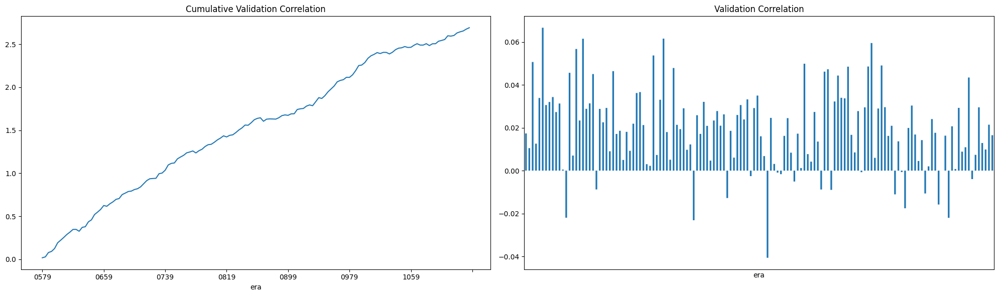

In [ ]:
per_era_corr_XGB = validation_results_XGB.groupby("era").apply(lambda x: practica_corr(x["prediction"], x["target"]))

fig, axes = plt.subplots(1, 2, figsize=(20, 6))
per_era_corr_XGB.cumsum().plot(kind="line", title="Cumulative Validation Correlation", ax=axes[0])
per_era_corr_XGB.plot(kind="bar", title="Validation Correlation", ax=axes[1], xticks=[], snap=False)
plt.tight_layout()
plt.show()

In [ ]:
# Calcula métricas de rendimiento para LGBM
corr_mean_LGBM = per_era_corr_LGBM.mean()
corr_std_LGBM = per_era_corr_LGBM.std(ddof=0)
corr_sharpe_LGBM = corr_mean_LGBM / corr_std_LGBM
max_drawdown_LGBM = (per_era_corr_LGBM.cumsum().expanding(min_periods=1).max() - per_era_corr_LGBM.cumsum()).max()

# Calcula métricas de rendimiento para XGB
corr_mean_XGB = per_era_corr_XGB.mean()
corr_std_XGB = per_era_corr_XGB.std(ddof=0)
corr_sharpe_XGB = corr_mean_XGB / corr_std_XGB
max_drawdown_XGB = (per_era_corr_XGB.cumsum().expanding(min_periods=1).max() - per_era_corr_XGB.cumsum()).max()

# Crear un DataFrame con las métricas de rendimiento para cada modelo
pd.DataFrame({
    "LGBM": [corr_mean_LGBM, corr_std_LGBM, corr_sharpe_LGBM, max_drawdown_LGBM],
    "XGB": [corr_mean_XGB, corr_std_XGB, corr_sharpe_XGB, max_drawdown_XGB]
}, index=["mean", "std", "sharpe", "max_drawdown"])


,LGBM,XGB
mean,0.017512,0.019229
std,0.018060,0.019018
sharpe,0.969654,1.011110
max_drawdown,0.044440,0.040628


1. Media  
    - Ambos modelos tienen una correlación positiva (bajita eso si) con los valores reales, lo que sugiere que ambos modelos tienden a predecir correctamente la dirección de los cambios.  
    - El modelo **XGB** tiene una media ligeramente mayor (0.019229 vs 0.017512), lo que sugiere que, en promedio, **XGB** tiene una correlación ligeramente mejor con los valores reales en comparación con LGBM.

2. Desviación Estándar  
    - Ambos modelos tienen desviaciones estándar similares, lo que indica que la variabilidad en las correlaciones es comparable entre los dos modelos.  
    - Una desviación estándar más baja indica correlaciones más consistentes a lo largo del tiempo. En este caso, **LGBM** tiene una desviación estándar ligeramente menor (0.018060 vs 0.019018), lo que sugiere que las correlaciones de **LGBM** son un poco más consistentes.

3. Sharpe  
    - Mide el rendimiento ajustado por riesgo del modelo, un ratio más alto indica un mejor rendimiento ajustado por riesgo. 
    - En este caso, **XGB** tiene un Sharpe ratio ligeramente mayor (1.011110 vs 0.969654), lo que sugiere que **XGB** tiene un mejor rendimiento ajustado por riesgo en comparación con LGBM.
    - Ambos tienen un ratio mayor al modelo base (0.918144)

4. Max Drawdown  
    - Mide la mayor caída desde un pico hasta un valle en las correlaciones acumuladas.
    - Un drawdown más bajo es mejor, ya que indica que las correlaciones acumuladas no han experimentado grandes caídas.
    - En este caso, **XGB** tiene un drawdown ligeramente menor (0.040628 vs 0.044440), lo que sugiere que las correlaciones acumuladas de **XGB** han experimentado caídas menores en comparación con LGBM.



In [13]:
from sklearn.metrics import mean_squared_error

# Calcula el error cuadrático medio
mse_XGB = mean_squared_error(validation_results_XGB["target"], validation_results_XGB["prediction"])
mse_LGBM = mean_squared_error(validation_results_LGBM["target"], validation_results_LGBM["prediction"])

# Calcula la raíz cuadrada del error cuadrático medio
rmse_XGB = np.sqrt(mse_XGB)
rmse_LGBM = np.sqrt(mse_LGBM)

# Imprime el error cuadrático medio
print(f"XGB RMSE: {rmse_XGB}")
print(f"LGBM RMSE: {rmse_LGBM}")



XGB RMSE: 0.2231970629944869
LGBM RMSE: 0.2232286538910732


---
---
---

## 4.SUBMISSIONS

Vamos a evaluar los modelos según su rendimiento en vivo!

La tarea es generar predicciones sobre valores objetivo desconocidos, que representan los rendimientos del mercado de valores dentro de X días.

In [94]:
# Descargar las últimas entradas en tiempo real
napi.download_dataset("v5.0/live.parquet")

# Carga dichas características
live_features = pd.read_parquet(f"v5.0/live.parquet", columns=feature_cols)


2024-12-08 15:09:55,226 INFO numerapi.utils: target file already exists
2024-12-08 15:09:55,226 INFO numerapi.utils: download complete


In [95]:

# Genera predicciones en vivo
live_predictions = model.predict(live_features[feature_cols])

#Evaluar
live_predictions

# Envío
pd.Series(live_predictions, index=live_features.index).to_frame("prediction")

,prediction
id,
n0008635e88ca726,0.490970
n000c74d28a8fd64,0.493142
n0012e5d7b36623c,0.500799
n00151656db36dc9,0.494630
n001ce1f41229725,0.496931
...,...
nffbdc6ba199c7c8,0.501823
nffbe436fb963726,0.501809
nffd56b2f0488e5a,0.487767


In [14]:
# Guardar los modelos

import joblib

# Guardar el modelo LGBM
joblib.dump(LGBMRegressor_model_best, "LGBMRegressor_model.pkl")

# Guardar el modelo XGB
joblib.dump(XGBRegressor_model_best, "XGBRegressor_model.pkl")

['XGBRegressor_model.pkl']

# Prueba a cargar el modelo

In [1]:
import pandas as pd
import json
# Carga solo el conjunto de features "medium" para reducir el uso de memoria y acelerar el entrenamiento del modelo 
# O bien, utiliza el conjunto de features "all" para usar todas las características
# Para pruebas rápidas puedes usar "small" (después usa "medimum")
feature_metadata = json.load(open("v5.0/features.json"))
feature_cols = feature_metadata["feature_sets"]["small"]
train = pd.read_parquet("v5.0/train.parquet", columns=["era", "target"] + feature_cols)

# Reduce la muestra, tomando cada cuatro eras, para reducir el uso de memoria y acelerar el entrenamiento del modelo (toma las eras 0001, 0005, 0009, ...)
# Comenta la línea a continuación para utilizar todos los datos.
train = train[train["era"].isin(train["era"].unique()[::4])]


In [2]:
import joblib

# Cargar el modelo LGBM
LGBMRegressor_model_best = joblib.load("LGBMRegressor_model.pkl")

# Cargar el modelo XGB
XGBRegressor_model_best = joblib.load("XGBRegressor_model.pkl")


In [3]:
XGBRegressor_model_best.fit(train[feature_cols], train["target"])
LGBMRegressor_model_best.fit(train[feature_cols], train["target"])

LGBMRegressor(colsample_bytree=0.5648853635979697,
              learning_rate=0.03675431495496091, max_depth=3,
              min_child_weight=34, min_split_gain=0.0003091886296351272,
              n_estimators=712, n_jobs=-1, num_leaves=166,
              reg_alpha=0.6398474685604615, reg_lambda=2.274261308467464,
              subsample=0.8235392744308611, verbosity=-1)

In [4]:
def validate_model(model, train, feature_cols, validation_path="v5.0/validation.parquet"):
	# Carga el validation data, filtrando por data_type == "validation"
	validation = pd.read_parquet(validation_path, columns=["era", "data_type", "target"] + feature_cols) 
	validation = validation[validation["data_type"] == "validation"]
	del validation["data_type"]

	# Reduce la muestra a cada cuarta era para reducir el uso de memoria y acelerar la evaluación
	# Comenta la siguiente línea para usar todos los datos (mayor uso de memoria, inferencia más lenta, evaluación más precisa)
	validation = validation[validation["era"].isin(validation["era"].unique()[::4])]

	# Las eras están separadas por una semana, pero los "targets" miran 4 semanas en el futuro, por lo que debemos "embargar" las 4 eras posteriores a nuestra última "era" para evitar fuga de datos.
	last_train_era = int(train["era"].unique()[-1])
	eras_to_embargo = [str(era).zfill(4) for era in [last_train_era + i for i in range(4)]]
	validation = validation[~validation["era"].isin(eras_to_embargo)]

	# Genera predicciones respecto a las características de validación fuera de la muestra.
	# Esto tomará unos pocos minutos 🍵
	validation["prediction"] = model.predict(validation[feature_cols])
	return validation[["era", "prediction", "target"]]

In [5]:
validation_results_XGB = validate_model(XGBRegressor_model_best, train, feature_cols)

In [6]:
validation_results_LGBM = validate_model(LGBMRegressor_model_best, train, feature_cols)

In [7]:
from scipy import stats
import numpy as np

# La principal métrica de scoring:
def practica_corr(preds, target):
    # clasifica (manteniendo vínculos) y luego gaussianiza las predicciones para estandarizar las distribuciones de predicción
    ranked_preds = (preds.rank(method="average").values - 0.5) / preds.count()
    gauss_ranked_preds = stats.norm.ppf(ranked_preds)
    # centra objetivos alrededor de 0
    centered_target = target - target.mean()
    # Levanta ambas predicciones y apunta a la potencia de 1,5 para acentuar las colas.
    preds_p15 = np.sign(gauss_ranked_preds) * np.abs(gauss_ranked_preds) ** 1.5
    target_p15 = np.sign(centered_target) * np.abs(centered_target) ** 1.5
    # Finalmente devuelve el Pearson correlation
    return np.corrcoef(preds_p15, target_p15)[0, 1]

In [8]:
per_era_corr_LGBM = validation_results_LGBM.groupby("era").apply(lambda x: practica_corr(x["prediction"], x["target"]))
per_era_corr_XGB = validation_results_XGB.groupby("era").apply(lambda x: practica_corr(x["prediction"], x["target"]))

C:\Users\David\AppData\Local\Temp\ipykernel_15540\2441116178.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  per_era_corr_LGBM = validation_results_LGBM.groupby("era").apply(lambda x: practica_corr(x["prediction"], x["target"]))
C:\Users\David\AppData\Local\Temp\ipykernel_15540\2441116178.py:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  per_era_corr_XGB = validation_results_XGB.groupby("era").apply(l

In [9]:
# Calcula métricas de rendimiento para LGBM
corr_mean_LGBM = per_era_corr_LGBM.mean()
corr_std_LGBM = per_era_corr_LGBM.std(ddof=0)
corr_sharpe_LGBM = corr_mean_LGBM / corr_std_LGBM
max_drawdown_LGBM = (per_era_corr_LGBM.cumsum().expanding(min_periods=1).max() - per_era_corr_LGBM.cumsum()).max()

# Calcula métricas de rendimiento para XGB
corr_mean_XGB = per_era_corr_XGB.mean()
corr_std_XGB = per_era_corr_XGB.std(ddof=0)
corr_sharpe_XGB = corr_mean_XGB / corr_std_XGB
max_drawdown_XGB = (per_era_corr_XGB.cumsum().expanding(min_periods=1).max() - per_era_corr_XGB.cumsum()).max()

# Crear un DataFrame con las métricas de rendimiento para cada modelo
pd.DataFrame({
    "LGBM": [corr_mean_LGBM, corr_std_LGBM, corr_sharpe_LGBM, max_drawdown_LGBM],
    "XGB": [corr_mean_XGB, corr_std_XGB, corr_sharpe_XGB, max_drawdown_XGB]
}, index=["mean", "std", "sharpe", "max_drawdown"])

,LGBM,XGB
mean,0.019438,0.019442
std,0.019127,0.019041
sharpe,1.016247,1.021070
max_drawdown,0.046548,0.043135
